In [1]:
import numpy as np
import xcompy as xc
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay
import os
from matplotlib.lines import Line2D

from mmd import plot_tessel, make_vmi

In [2]:
# lol
import warnings
warnings.filterwarnings("ignore")

In [3]:
def bf(string):  
    '''make text boldface'''
    return "\\textbf{"+string+"}"

def label_panels(ax, c='k', loc='outside', dx=-0.06, dy=0.09, fontsize=None,
                 label_type='lowercase', label_format='({})', i0=0):
    '''
    Function to label panels of multiple subplots in a single figure.

    Parameters
    ----------
    ax : matplotlib AxesSubplot
    c : (str) color of text. The default is 'k'.
    loc : (str), location of label, 'inside' or 'outside'. 
    dx : (float) x location relative to upper left corner. The default is 0.07.
    dy : (float) y location relative to upper left corner. The default is 0.07.
    fontsize : (number), font size of label. The default is None.
    label_type : (str), style of labels. The default is 'lowercase'.
    label_format : (str) format string for label. The default is '({})'.

    '''
    if 'upper' in label_type:
        labels = list(map(chr, range(65,91)))
    elif 'lower' in label_type:
        labels = list(map(chr, range(97, 123)))
    else: # default to numbers
        labels = np.arange(1,27).astype(str)
    labels = [ label_format.format(x) for x in labels ]

    # get location of text
    if loc == 'outside':
        xp, yp = -dx, 1+dy
    else:
        xp, yp = dx, 1-dy
        
    for i, axi in enumerate(ax.ravel()):
        xmin, xmax = axi.get_xlim()
        ymin, ymax = axi.get_ylim()
        xloc = xmin + (xmax-xmin)*xp
        yloc = ymin + (ymax-ymin)*yp
        
        label = labels[i0+i]
        axi.text(xloc, yloc, bf(label), color=c, fontsize=fontsize,
          va='center', ha='center')
        
    return None

def plot_tessel2(mats, E1, E2, xy=None, imgs=None, tri_inds_all=None, ax=None, legend=None, 
                 markerstyle='.', linecolor='k',lw=.5):
    assert ax is not None
    assert legend is not None
    E = np.array([E1, E2], dtype=np.float64)

    # get the linear atten coeff's ! (mu_vals)
    points = []
    names = []
    for name, density, matcomp in mats:
        mu_vals = density*xc.mixatten(matcomp, E)
        points.append(mu_vals)
        names.append(name.split('_')[0])
    points = np.array(points)
    if tri_inds_all is None:
        tri = Delaunay(points)
        tri_inds_all = tri.simplices

    if imgs is not None: 
        M1, M2 = imgs
        ax.plot(M1.ravel(), M2.ravel(), 'b.', markersize=.1)
        legend.append(Line2D([0], [0], marker='.', ls='', color='b', markersize=.4, label='images'))
        
    ax.triplot(points[:,0], points[:,1], tri_inds_all, color=linecolor, ls='-', lw=lw, alpha=0.7)
    for i in range(len(mats)):
        x, y = points[i]
        name = names[i]
        p = ax.plot(x,y, marker=markerstyle, ls='', markerfacecolor='None')#, color='k')
        legend.append(Line2D([0], [0], marker=markerstyle, ls='', color=p[0].get_color(), markerfacecolor='None', label=name))



In [4]:
plt.rcParams.update({
    # figure
    "figure.dpi": 300,   # higher quality image
    # text
    "font.size":10,
    "font.family": "serif",                  # uncomment for tex style
    "font.serif": ['Computer Modern Roman'], # uncomment for tex style
    "text.usetex": True,                     # uncomment for tex style
    "text.latex.preamble": r'\usepackage{amsmath}',
    # axes
    "axes.titlesize": 10,
    "axes.labelsize": 8,
    "axes.linewidth": 1,
    # ticks
    "xtick.top": True,
    "ytick.right": True,
    "xtick.direction": "in",
    "ytick.direction": "in",
    "xtick.labelsize":8,
    "ytick.labelsize":8,
    # grid
    "axes.grid" : False,
    "axes.grid.which" : "major",
     "grid.color": "lightgray",
     "grid.linestyle": ":",
     # legend
     "legend.fontsize":8,
    "legend.facecolor":'white',
    "legend.framealpha":1.0 ,  
    # image
    "image.cmap":'gray'
     })

In [5]:
def to_HU(mu, E0):
    # approx air as 0
    ua = 0
    data = []
    f = open('input/vmi_data.txt', 'r')
    for line in f.readlines()[1:]:  # skip 1st line, header
        data.append(np.array(line.split(), dtype=np.float64))
    f.close()
    data = np.array(data).T
    E, mac1_E, mac2_E, mac_water_E = data
    uw = np.interp(E0, E, mac_water_E)
    return 1000*(mu-uw)/(uw-ua)


# SPIE 2024 plots

In [21]:
# general data loc etc.
phantom_id = 'cylinder_5mats'
kVp1, kVp2 = 80, 140  # original spec
E1, E2 = 70, 140      # monos
i_bmi = 1             # T/B or H2O/Al
vmi_bmats = ['', 'tissue/bone', 'water/aluminum']  # blank 0 to index from 1, lol
vmi_bmats_tall = ['', 'tissue/\nbone', 'water/\naluminum']  # blank 0 to index from 1, lol
col_bmats = ['', 'b', 'r']

# standard legend
bmat_legend=[]
bmat_legend_tall=[]
for i_bmi in [1,2]:
    bmat_legend.append(Line2D([0], [0], marker='', ls='-', color=col_bmats[i_bmi], label=vmi_bmats[i_bmi]))
    bmat_legend_tall.append(Line2D([0], [0], marker='', ls='-', color=col_bmats[i_bmi], label=vmi_bmats_tall[i_bmi]))
    
N_matrix = 512

matnames0 = ['air', 'water', 'tissue_icru', 'fat', 'calcium', 'omni300_in_blood']
matnames = ['air', 'water', 'tissue', 'fat', 'calcium', 'Omnipaque 300']
matcomp_tiss = 'H(10.2)C(14.3)N(3.4)O(70.8)Na(0.2)P(0.3)S(0.3)Cl(0.2)K(0.3)'   # tissue
matcomp_bone = 'H(3.4)C(15.5)N(4.2)O(43.5)Na(0.1)Mg(0.2)P(10.3)S(0.3)Ca(22.5)' # bone
matcomp_water = 'H2O'      # water
matcomp_alum = 'Al(1.0)'  # aluminum

# data loading
def get_outdirD(i_bmi, D):
    return f'output/sim_{phantom_id}/matdecomp{i_bmi}_{int(np.round(1000*D,decimals=-2))}uGy/'

def load_cnr(i_bmi, D):
    return np.fromfile(get_outdirD(i_bmi, D)+'cnr.bin', dtype=np.float32)

def load_rmse(i_bmi, D):
    return np.fromfile(get_outdirD(i_bmi, D)+'rmse.bin', dtype=np.float32)

def load_cnrs(i_bmi, doses):
    return np.array([load_cnr(i_bmi, D) for D in doses]).T # transpose to give list for each mat

def load_rmses(i_bmi, doses):
    return np.array([load_rmse(i_bmi, D) for D in doses]).T

def load_noise(i_bmi):
    data = np.fromfile(f'output/sim_{phantom_id}/matdecomp{i_bmi}_noise_{E1}_{E2}.bin', dtype=np.float32)
    doses, noise1, noise2 = data.reshape([3, len(data)//3])
    return doses, noise1, noise2    

def load_mmd_bmi(i_bmi, matname, D):   # final multi-mat decomp basis images    
    return np.fromfile(get_outdirD(i_bmi, D)+f'{matname}.bin', dtype=np.float32).reshape([N_matrix,N_matrix])

def load_2md_bmi(i_bmi, i_mat, D):   # initial two-mat decomp (VMI) basis images
    uGy = f'{int(np.round(1000*D,decimals=-2)):04}'
    fname = f'input/sim_{phantom_id}/two_mat_decomp/matdecomp{i_bmi}_{kVp1}kV_{kVp2}kV/{uGy}uGy_{uGy}uGy/mat{i_mat}_recon_512_50cm_100ramp.bin' 
    return np.fromfile(fname, dtype=np.float32).reshape([N_matrix,N_matrix])


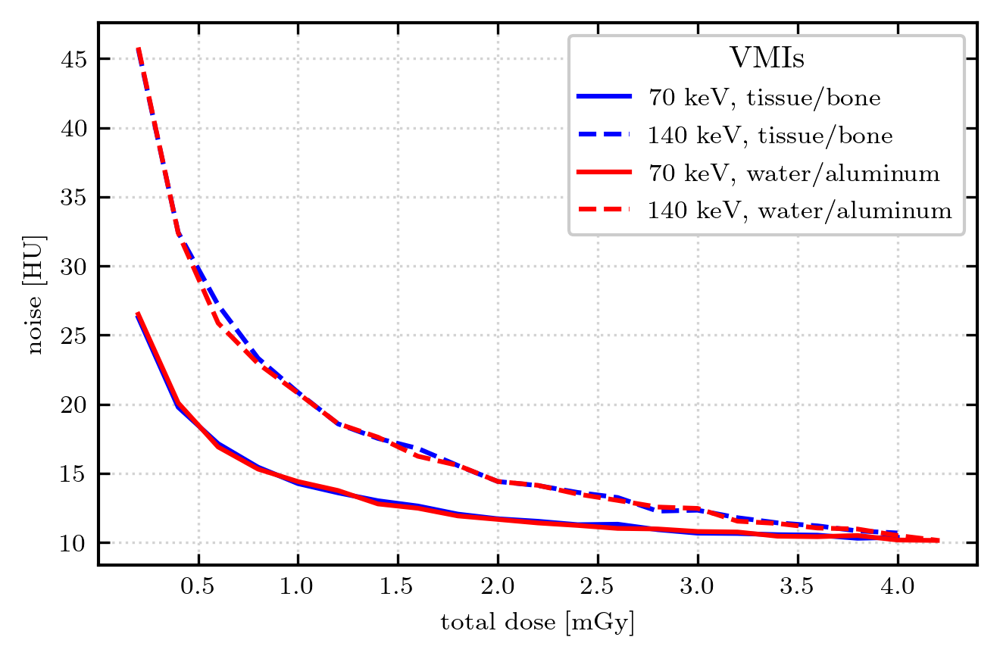

In [7]:
### PLOT 1 - noise vs. dose

fig, ax = plt.subplots(1,1,dpi=300,figsize=[4.5,3])

for i_bmi in [1,2]:
    vmi_bmat = vmi_bmats[i_bmi]
    doses, noise1, noise2 = load_noise(i_bmi)
    ax.plot(2*doses, noise1, '-', color=col_bmats[i_bmi], label=f'{E1} keV, {vmi_bmats[i_bmi]}')
    ax.plot(2*doses, noise2, '--', color=col_bmats[i_bmi], label=f'{E2} keV, {vmi_bmats[i_bmi]}')
    ax.set_xlabel('total dose [mGy]')
    ax.set_ylabel('noise [HU]')
    ax.legend(title='VMIs')
    ax.grid(True)
fig.tight_layout()
#plt.savefig(f'output/sim_cylinder_5mats/figs/noise_vs_dose_small.png', bbox_inches='tight')
#plt.savefig(f'output/sim_cylinder_5mats/figs/noise_vs_dose.png', bbox_inches='tight')
plt.show()

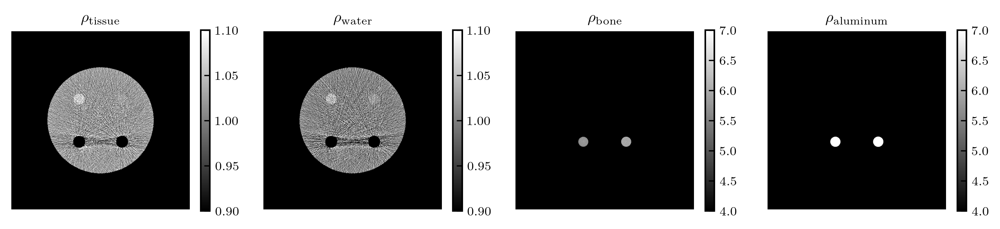

In [19]:
### PLOT - BMIs at ~1 mGy
D0 = 1. # 1 mGy

fig, ax = plt.subplots(1,4,dpi=300,figsize=[9,2], sharey=False)  

bmi_tiss = load_2md_bmi(1, 1, D0)
bmi_bone = load_2md_bmi(1, 2, D0)
bmi_water = load_2md_bmi(2, 1, D0)
bmi_alum =  load_2md_bmi(2, 2, D0)

#names = ['tissue', 'bone','water', 'aluminum']
# names = ['$\\rho_\\text{tissue}$', '$\\rho_\\text{bone}$','$\\rho_\\text{water}$', '$\\rho_\\text{aluminum}$']
# bmis = [bmi_tiss, bmi_bone, bmi_water, bmi_alum]
names = ['$\\rho_\\text{tissue}$', '$\\rho_\\text{water}$',  '$\\rho_\\text{bone}$', '$\\rho_\\text{aluminum}$']
bmis = [bmi_tiss, bmi_water, bmi_bone, bmi_alum]
kws = [{'cmap':'gray','vmin':0.9, 'vmax':1.1}, 
       {'cmap':'gray','vmin':0.9, 'vmax':1.1},
       {'cmap':'gray','vmin':4, 'vmax':7},
       {'cmap':'gray','vmin':4, 'vmax':7}]
for i in range(4):
    m = ax[i].imshow(bmis[i], **kws[i])
    fig.colorbar(m, ax=ax[i])
    ax[i].set_title(names[i])
    ax[i].axis('off')

fig.tight_layout()
plt.show()

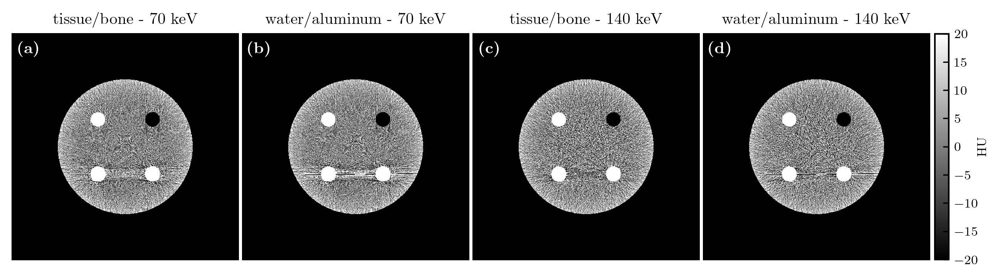

In [23]:
### PLOT - VMIs at ~1 mGy
D0 = 1 # 1 mGy


bmi_tiss = load_2md_bmi(1, 1, D0)
bmi_bone = load_2md_bmi(1, 2, D0)
bmi_water = load_2md_bmi(2, 1, D0)
bmi_alum =  load_2md_bmi(2, 2, D0)

vmi1_tb = make_vmi(E1, bmi_tiss, bmi_bone, matcomp_tiss, matcomp_bone)
vmi2_tb = make_vmi(E2, bmi_tiss, bmi_bone, matcomp_tiss, matcomp_bone)
vmi1_wa = make_vmi(E1, bmi_water, bmi_alum, matcomp_water, matcomp_alum)
vmi2_wa = make_vmi(E2, bmi_water, bmi_alum, matcomp_water, matcomp_alum)

vmi1_tb = to_HU(vmi1_tb, E1)
vmi2_tb = to_HU(vmi2_tb, E2)
vmi1_wa = to_HU(vmi1_wa, E1)
vmi2_wa = to_HU(vmi2_wa, E2)

# choose the order
names = [f'tissue/bone - {E1} keV', f'water/aluminum - {E1} keV',  f'tissue/bone - {E2} keV', f'water/aluminum - {E2} keV']
vmis = [vmi1_tb, vmi1_wa, vmi2_tb, vmi2_wa]
# names = [f'tissue/bone - {E1} keV', f'tissue/bone - {E2} keV', f'water/aluminum - {E1} keV', f'water/aluminum - {E2} keV']
# vmis = [vmi1_tb, vmi2_tb, vmi1_wa, vmi2_wa]

fig, ax = plt.subplots(1,4,dpi=300,figsize=[8,2.3], sharey=False)  
#kw = {'cmap':'gray','vmin':-30, 'vmax':30}
kw = {'cmap':'gray','vmin':-20, 'vmax':20}
for i in range(4):
    m = ax[i].imshow(vmis[i], **kw)
    #fig.colorbar(m, ax=ax[i])
    ax[i].set_title(names[i])
    ax[i].axis('off')
cbaxes = fig.add_axes([1.002, 0.075 , 0.015, 0.85]) 
cb = plt.colorbar(m, cax=cbaxes)
cb.set_label(label='HU',labelpad=-1)
label_panels(ax, c='w', loc='inside', dx=0.08, dy=0.07)
fig.tight_layout(pad=0.2)
#plt.savefig('output/sim_cylinder_5mats/figs/vmi_compare.png', bbox_inches='tight')
plt.show()

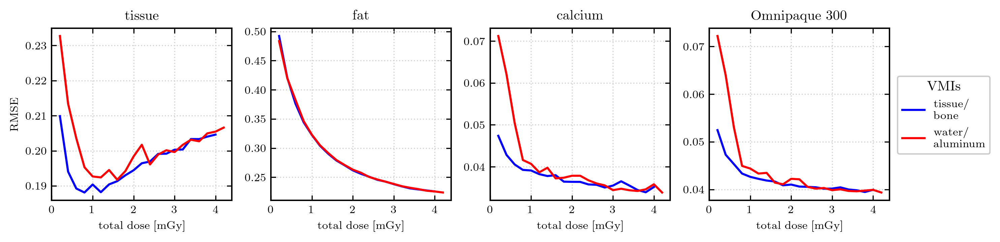

In [24]:
### PLOT 2 - RMSE/CNR vs. dose

fig, ax = plt.subplots(1,4,dpi=300,figsize=[9,2.5], sharey=False)  # four basis mats

for i_bmi in [1,2]:
    vmi_bmat = vmi_bmats[i_bmi]
    doses, noise1, noise2 = load_noise(i_bmi)
    rmses = load_rmses(i_bmi, doses)  # for each basis mat, in order
    for i in range(4): # look at the material inserts:
        i_mat = i+2
        ax[i].plot(2*doses, rmses[i_mat], '-', color=col_bmats[i_bmi], label=vmi_bmats[i_bmi])
        ax[i].set_title(matnames[i_mat])

for axi in ax:
    axi.grid(True)
    axi.set_xlabel('total dose [mGy]')
    axi.set_xlim(0,None)

fig.legend(handles=bmat_legend_tall, bbox_to_anchor=(1.1,0.7), title='VMIs')#loc='center right')
ax[0].set_ylabel('RMSE')

fig.tight_layout(w_pad=0.5)
plt.show()

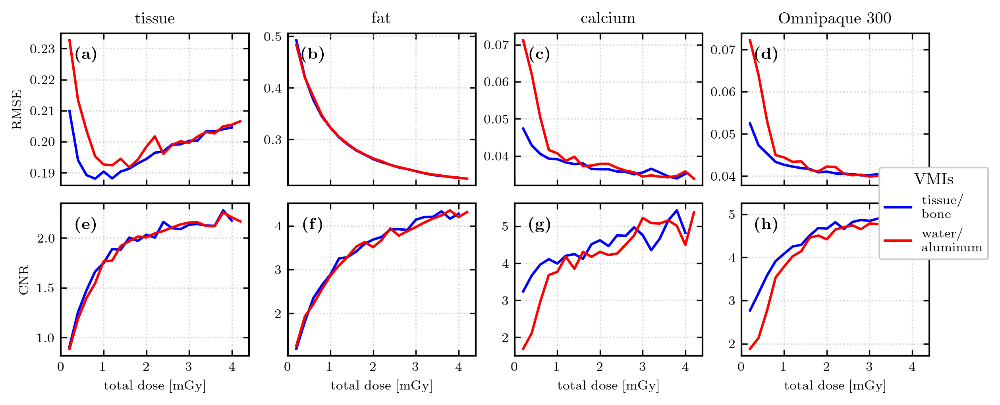

In [25]:
### PLOT 3 - both** RMSE and CNR vs. dose

fig, ax = plt.subplots(2,4,dpi=300,figsize=[8,3.5], sharex=True)  # four basis mats
ax[0,0].set_ylabel('RMSE')
ax[1,0].set_ylabel('CNR') 

for i_bmi in [1,2]:
    vmi_bmat = vmi_bmats[i_bmi]
    doses, noise1, noise2 = load_noise(i_bmi)
    rmses = load_rmses(i_bmi, doses)  # for each basis mat, in order
    cnrs = load_cnrs(i_bmi, doses)  # for each basis mat, in order
    for i in range(4): # look at the material inserts:
        i_mat = i+2
        ax[0,i].set_title(matnames[i_mat])
        ax[0,i].plot(2*doses, rmses[i_mat], '-', color=col_bmats[i_bmi])
        ax[1,i].plot(2*doses, np.abs(cnrs[i_mat]), '-', color=col_bmats[i_bmi])
        ax[1,i].set_xlabel('total dose [mGy]')
    
for axi in ax.ravel():
    axi.grid(True)
    axi.set_xlim(0,None)
    axi.set_xticks(np.arange(5))

label_panels(ax, c='k', loc='inside', dx=0.14,dy=0.14)
fig.legend(handles=bmat_legend_tall, bbox_to_anchor=(1.05,0.6), title='VMIs')#loc='center right')
#plt.savefig(f'output/sim_cylinder_5mats/figs/rmse_and_cnr.png', bbox_inches='tight')
fig.tight_layout(w_pad=0.5)
plt.show()

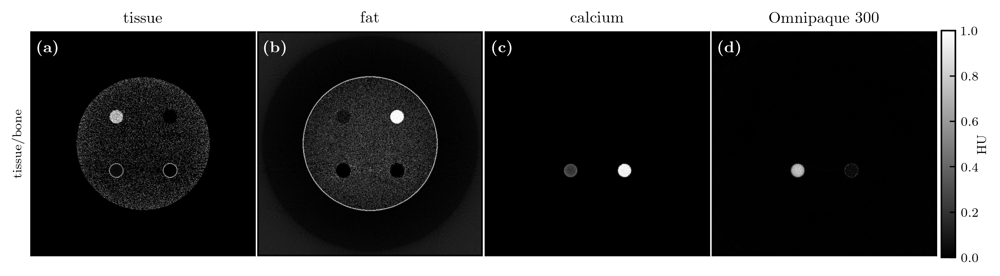

In [26]:
### PLOT 4 - example images of basis materials at different noise levels

D0 = 2 # mGy

fig, ax = plt.subplots(1,4,dpi=300,figsize=[8,2.3], sharey=False)  
kw = {'cmap':'gray','vmin':0, 'vmax':1}

for i_bmi in [1]:
    for i in range(4):
        i_mat = i+2
        mmd_bmi = load_mmd_bmi(i_bmi, matnames0[i_mat], D0)
        m = ax[i].imshow(mmd_bmi, **kw)
        ax[i].set_title(matnames[i_mat])
        #ax[i].axis('off')
        ax[i].set_xticks([])
        ax[i].set_yticks([])
ax[0].set_ylabel('tissue/bone')

cbaxes = fig.add_axes([1.002, 0.075 , 0.015, 0.85]) 
cb = plt.colorbar(m, cax=cbaxes)
cb.set_label(label='HU',labelpad=-1)
label_panels(ax, c='w', loc='inside', dx=0.08, dy=0.07)
fig.tight_layout(pad=0.2)
#plt.savefig(f'output/sim_cylinder_5mats/figs/matdecomp{i_bmi}_imgs_{int(1000*uGy)}uGy.png', bbox_inches='tight')
plt.show()

0.5


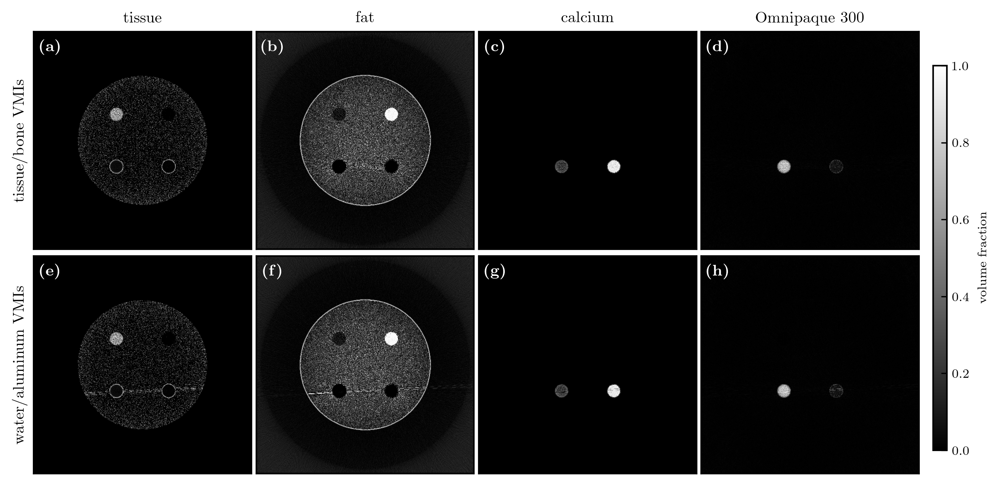

1


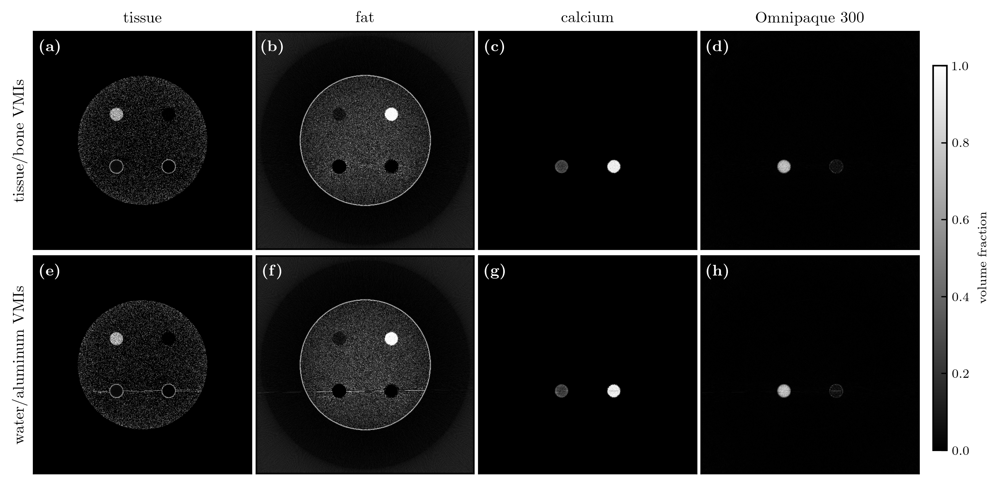

2


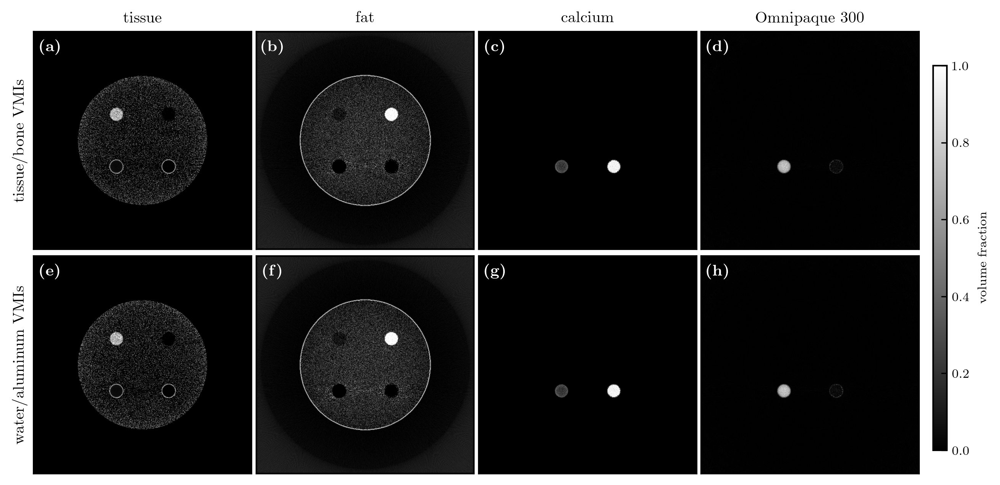

In [27]:
### PLOT 4 - example images of basis materials at different noise levels

for D0 in [.5,1,2]:
    print(D0)
    
    fig, ax_all = plt.subplots(2,4,dpi=300,figsize=[8,4.2], sharey=False)  
    kw = {'cmap':'gray','vmin':0, 'vmax':1}
    
    for i_bmi in [1,2]:
        ax = ax_all[i_bmi-1]
        ax[0].set_ylabel(vmi_bmats[i_bmi]+' VMIs', fontsize=10)
        for i in range(4):
            i_mat = i+2
            mmd_bmi = load_mmd_bmi(i_bmi, matnames0[i_mat], D0)
            m = ax[i].imshow(mmd_bmi, **kw)
            ax_all[0,i].set_title(matnames[i_mat])
            #ax[i].axis('off')
            ax[i].set_xticks([])
            ax[i].set_yticks([])
    
    cbaxes = fig.add_axes([1.01, 0.075 , 0.015, 0.8]) 
    cb = plt.colorbar(m, cax=cbaxes)
    cb.set_label(label='volume fraction',labelpad=5)
    label_panels(ax_all, c='w', loc='inside', dx=0.08, dy=0.07)
    fig.tight_layout(pad=0.3)
    #plt.savefig(f'output/sim_cylinder_5mats/figs/matdecomp_compare_imgs_{int(1000*D0)}uGy.png', bbox_inches='tight')
    plt.show()


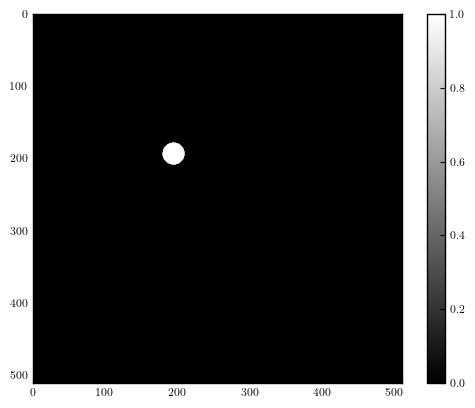

In [15]:
## check phantom - cylinders in correct location for RMSE/CNR calcs ?

## ground truth phantom
N_phantom = 512
fname_phantom = f'input/sim_{phantom_id}/raw/{phantom_id}_{N_phantom}x{N_phantom}_uint8.bin'
phantom = np.fromfile(fname_phantom, dtype=np.uint8).reshape([N_phantom, N_phantom]).T
fig,ax=plt.subplots(dpi=100)

## signal check
sig = np.zeros(phantom.shape)
sig[np.where(phantom==2)] = 1   # material index 2
plt.imshow(sig)
plt.colorbar()
plt.show()